# **Identificación y Clasificación de Mariposas**

* Julian Esteban Carvajal Ramirez 	1001774262
* Jose Gregorio Miranda Madariaga 	1192736412
* Ruber Ballesteros Lora 	1003459465
* Santiago Correa Cano 	1007223413
* Juan Diego Blandon Rosero	1152717206



Los sistemas de visión artifcial son métodos inteligentes que posibilitan de manera detallada y precisa el procesamiento y análisis de imagenes. 

En este microproyecto se identificará y clasificará 75 especies de mariposas mediante una red neuronal convolucional de clasificación.
Se partirá del procesamiento de las imagenes, analizando los canales y optimizando la resolución; posteriormente se segmentarán la imagen para hallar las máscaras. Finalmente se pasará a la red neuronal convolucional, donde se clasificarán las mariposas en sus respectivas categorías.
Se hará uso de dos datasets. Uno importado desde kaggle, el cual se empleará para entrenar la red neuronal y tiene incorporados los subconjuntos: train, test y valid. Estos subconjuntos son necesarios para evitar situaciones en las que aparezcan análisis falsos y se generen compilaciones graves de los análisis y garantizar una buena presición. El otro dataset se encarga de la identificación mediante una recolección propia.


# **Identificación**

## Librerias

In [3]:
from skimage import*
import matplotlib.pyplot as plt
import cv2 as cv2
import numpy as np
from PIL import Image
from IPython.display import Image
from skimage.filters import sobel_v,sobel_h, sobel
import skimage
from scipy.special import xlogy
import skimage.io
import skimage.morphology as morph

## Preprocesamiento

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


-1

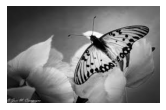

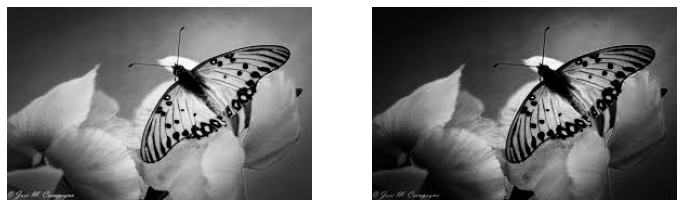

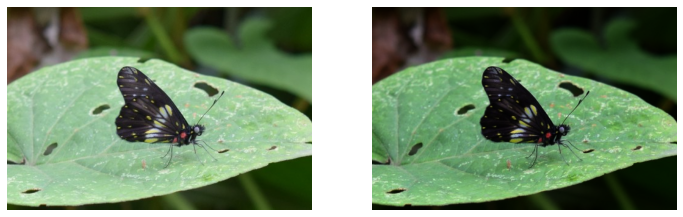

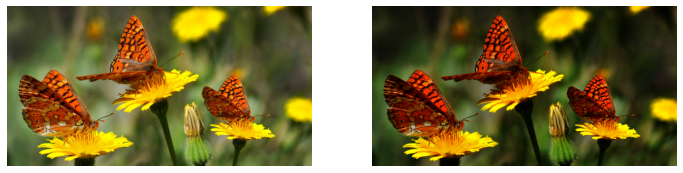

In [ ]:
im=cv2.cvtColor(cv2.imread('/prueba10.jpg'),cv2.COLOR_BGR2RGB)  
plt.subplot(1, 2, 1)
plt.imshow(im)
plt.axis('off')
im = im/255.0
plt.figure(figsize = [12, 12])
im_power_law_transformation = cv2.pow(im,1.7)
plt.subplot(1, 2, 2)
plt.imshow(im_power_law_transformation)
plt.axis('off')
cv2.waitKey(0)

im=cv2.cvtColor(cv2.imread('/prueba10.jpg'),cv2.COLOR_BGR2RGB)  
plt.subplot(1, 2, 1)
plt.imshow(im)
plt.axis('off')
im = im/255.0
plt.figure(figsize = [12, 12])
im_power_law_transformation = cv2.pow(im,1.7)
plt.subplot(1, 2, 2)
plt.imshow(im_power_law_transformation)
plt.axis('off')
cv2.waitKey(0)

im1=cv2.cvtColor(cv2.imread('/mariposa12.jpg'),cv2.COLOR_BGR2RGB)  
plt.subplot(1, 2, 1)
plt.imshow(im1)
plt.axis('off')
im1 = im1/255.0
im_power_law_transformation1 = cv2.pow(im1,1.7)
plt.subplot(1, 2, 2)
plt.imshow(im_power_law_transformation1)
plt.axis('off')
cv2.waitKey(0)

im2=cv2.cvtColor(cv2.imread('/prueba4.jpg'),cv2.COLOR_BGR2RGB)  
plt.figure(figsize = [12, 12])
plt.subplot(1, 2, 1)
plt.imshow(im2)
plt.axis('off')
im2 = im2/255.0
im_power_law_transformation2 = cv2.pow(im2,1.7)
plt.subplot(1, 2, 2)
plt.imshow(im_power_law_transformation2)
plt.axis('off')
cv2.waitKey(0)

Canales LAB


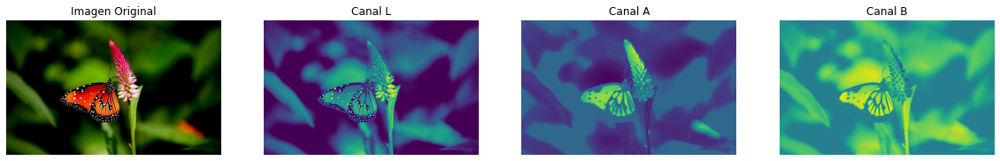

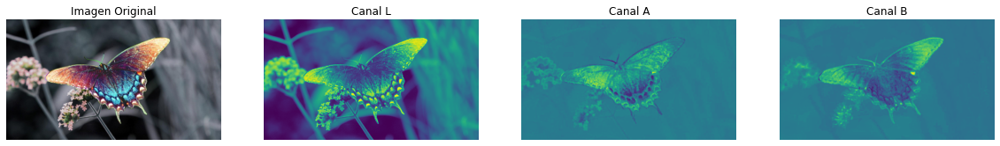

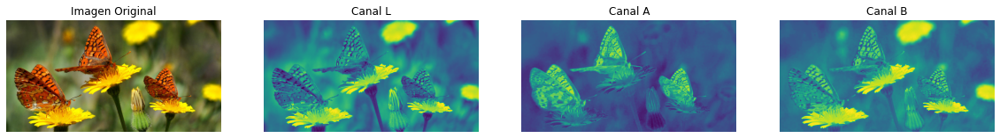

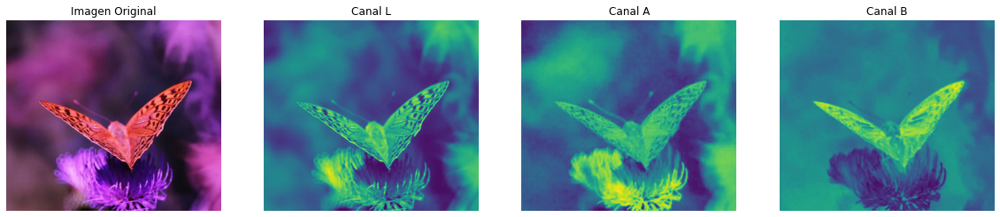

Canales YCrCb


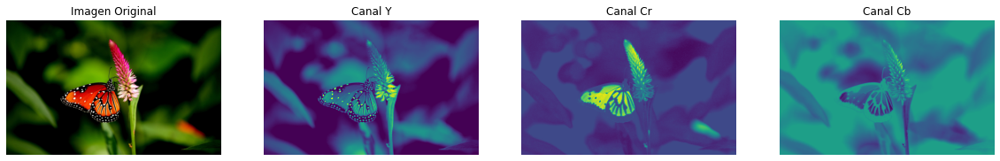

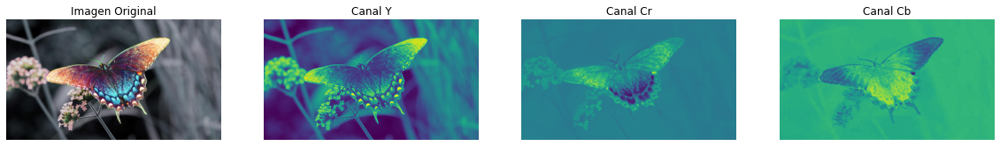

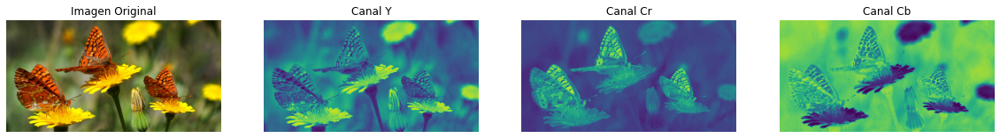

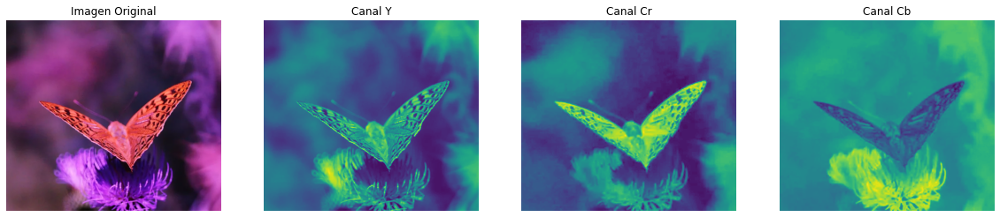

Canales RGB


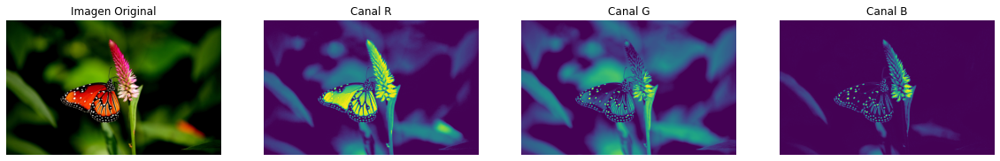

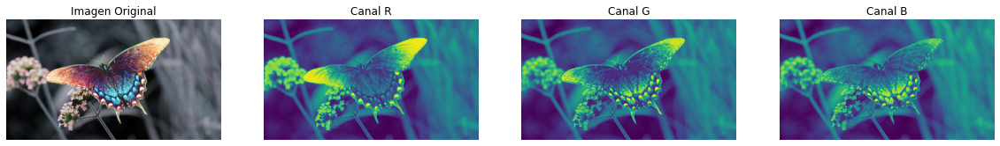

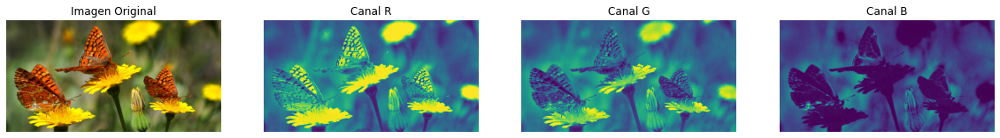

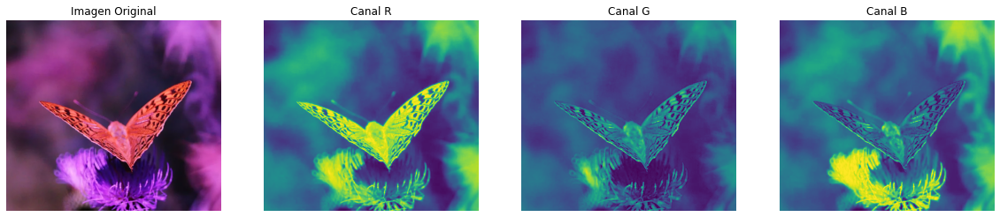

Canales XYZ


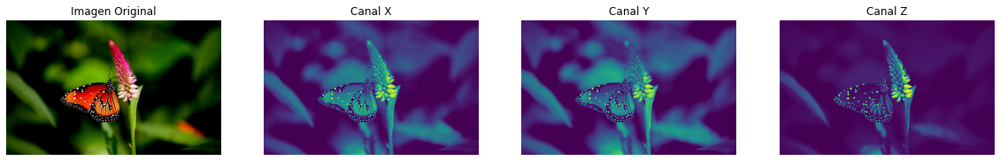

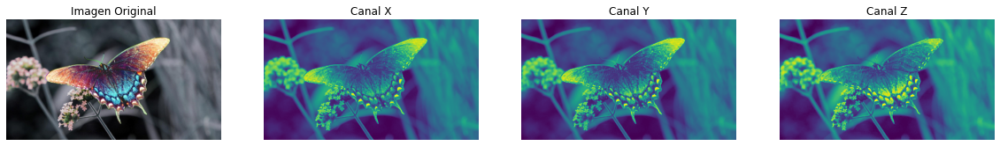

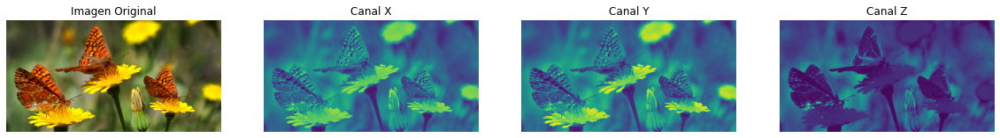

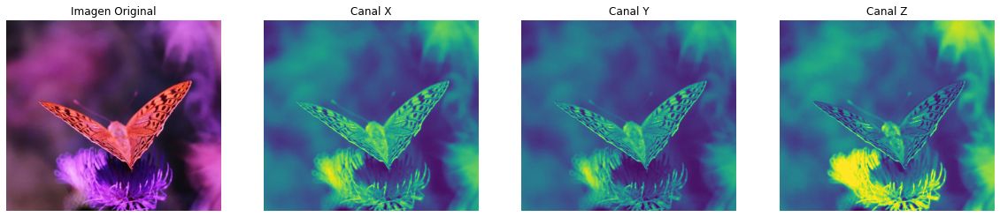

In [4]:
print('Canales LAB')
n=5
for i in range(1,n):
    name_archivo=str('/prueba'+str(i+1)+'.jpg')
    Imag_LAB=cv2.cvtColor(cv2.imread(name_archivo),cv2.COLOR_BGR2LAB)
    image_c=cv2.cvtColor(cv2.imread(name_archivo),cv2.COLOR_BGR2RGB)
    Imag_L=Imag_LAB[:,:,0]
    Imag_A=Imag_LAB[:,:,1]
    Imag_B=Imag_LAB[:,:,2]
    plt.figure(figsize=[20,20])
    plt.subplot(1,4,1), plt.imshow(image_c),plt.axis('off'),plt.title('Imagen Original')
    plt.subplot(1,4,2), plt.imshow(Imag_L),plt.axis('off'),plt.title('Canal L')
    plt.subplot(1,4,3), plt.imshow(Imag_A),plt.axis('off'),plt.title('Canal A')
    plt.subplot(1,4,4), plt.imshow(Imag_B),plt.axis('off'),plt.title('Canal B')
    plt.show()

print('Canales YCrCb')
for i in range(1,n):
    name_archivo=str('/prueba'+str(i+1)+'.jpg')
    Imag_YCrCb=cv2.cvtColor(cv2.imread(name_archivo),cv2.COLOR_BGR2YCrCb)
    image_c1=cv2.cvtColor(cv2.imread(name_archivo),cv2.COLOR_BGR2RGB)
    Imag_Y=Imag_YCrCb[:,:,0]
    Imag_Cr=Imag_YCrCb[:,:,1]
    Imag_Cb=Imag_YCrCb[:,:,2]
    plt.figure(figsize=[20,20])
    plt.subplot(1,4,1), plt.imshow(image_c1),plt.axis('off'),plt.title('Imagen Original')
    plt.subplot(1,4,2), plt.imshow(Imag_Y),plt.axis('off'),plt.title('Canal Y')
    plt.subplot(1,4,3), plt.imshow(Imag_Cr),plt.axis('off'),plt.title('Canal Cr')
    plt.subplot(1,4,4), plt.imshow(Imag_Cb),plt.axis('off'),plt.title('Canal Cb')
    plt.show()

print('Canales RGB')
for i in range(1,n):
    name_archivo=str('/prueba'+str(i+1)+'.jpg')
    Imag_RGB=cv2.cvtColor(cv2.imread(name_archivo),cv2.COLOR_BGR2RGB)
    image_c2=cv2.cvtColor(cv2.imread(name_archivo),cv2.COLOR_BGR2RGB)
    Imag_R=Imag_RGB[:,:,0]
    Imag_G=Imag_RGB[:,:,1]
    Imag_B1=Imag_RGB[:,:,2]
    plt.figure(figsize=[20,20])
    plt.subplot(1,4,1), plt.imshow(image_c2),plt.axis('off'),plt.title('Imagen Original')
    plt.subplot(1,4,2), plt.imshow(Imag_R),plt.axis('off'),plt.title('Canal R')
    plt.subplot(1,4,3), plt.imshow(Imag_G),plt.axis('off'),plt.title('Canal G')
    plt.subplot(1,4,4), plt.imshow(Imag_B1),plt.axis('off'),plt.title('Canal B')
    plt.show()

print('Canales XYZ')
for i in range(1,n):
    name_archivo=str('/prueba'+str(i+1)+'.jpg')
    Imag_XYZ=cv2.cvtColor(cv2.imread(name_archivo),cv2.COLOR_BGR2XYZ)
    image_c3=cv2.cvtColor(cv2.imread(name_archivo),cv2.COLOR_BGR2RGB)
    Imag_X=Imag_XYZ[:,:,0]
    Imag_Y=Imag_XYZ[:,:,1]
    Imag_Z=Imag_XYZ[:,:,2]
    plt.figure(figsize=[20,20])
    plt.subplot(1,4,1), plt.imshow(image_c3),plt.axis('off'),plt.title('Imagen Original')
    plt.subplot(1,4,2), plt.imshow(Imag_X),plt.axis('off'),plt.title('Canal X')
    plt.subplot(1,4,3), plt.imshow(Imag_Y),plt.axis('off'),plt.title('Canal Y')
    plt.subplot(1,4,4), plt.imshow(Imag_Z),plt.axis('off'),plt.title('Canal Z')
    plt.show()

**Análisis de desempeño de los canales**

**Canales LAB** 
<br>
**Canal L.** Se puede distinguir la mariposa del entorno en aquellos caso en los que el contraste entre el color de la mariposa y el ambiente es alto; se observan resultados positivos cuando las mariposas son de una tonalidad rojiza.

**Canal A.** Para casos muy particulares, se puede distinguir la mariposa del entorno; sin embargo, los resultados se sitúan por debajo de los obtenidos con el canal L.

**Canal B.** En la mayoría de los casos resulta muy difícil hacer una diferenciación entre la mariposa y su entorno; el desempeño de este canal frente al de los dos anteriores es más bien pobre.
<br>
<br>
**Canales YCrCb**
<br>
**Canal Y.** Tras convertir la imagen al formato YCrCb y separarla en sus respectivos canales, se logra apreciar claramente que los resultados que entrega el canal Y son muy satisfactorios en lo que respecta a diferenciación entre la mariposa y el entorno.

**Canales Cr y Cb.** En ambos casos, los resultados obtenidos son superiores frente a los que entregan los canales LAB; sin embargo, yacen un poco por debajo del canal Y.
<br>
<br>
**Canales RGB**
<br>
**Canal R.** Como era de esperar, cuando hay mariposas de tonalidades rojizas en las imágenes, el contraste entre las mismas, y su entorno, es muy notable; no obstante, flaquea en aquellas situaciones donde la mariposa es de colores oscuros y/o el fodo de la imagen posee un contenido de rojo considerable.

**Canal G.** No permite distinguir de forma sencilla la mariposa de su entorno.

**Canal B.** De los tres canales del espacio RGB, este es el de peor desempeño; en algunas situaciones se vuelve prácticamente imposible distinguir algo en la imagen.
<br>
<br>
**Canales XYZ**
<br>
**Canales X e Y.** En general, no hacen un buen trabajo si es que queremos usarlos para distinguir las mariposas del resto de la imagen.

**Canal Z.** Si bien los canales X e Y no tienen un gran desempeño, este canal lo hace un poco peor; en algunos casos particulares, es incluso equiparable con el canal B del espacio RGB.

### Metodo convencional


#### Segmentacion(Canny)


(<matplotlib.image.AxesImage at 0x7f64ab8bf790>,
 Text(0.5, 1.0, 'mask mariposa'),
 (-0.5, 799.5, 499.5, -0.5))

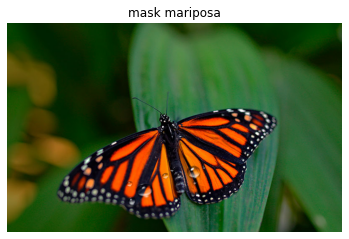

In [ ]:
image=cv2.cvtColor(cv2.imread('/prueba1.jpg'),cv2.COLOR_BGR2RGB)
image_1=image.copy()#proposito de utilizar canal
plt.imshow(image),plt.title("mask mariposa"),plt.axis('off')

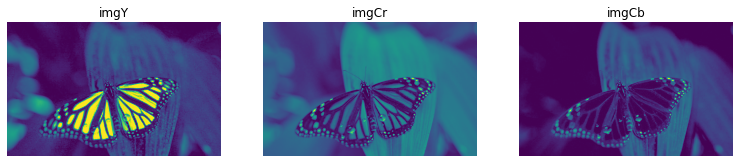

In [ ]:
imgYCrCb=cv2.cvtColor(cv2.imread('/prueba1.jpg'),cv2.COLOR_BGR2YCrCb)
imgYCrCb_1=imgYCrCb.copy
image=cv2.cvtColor(cv2.imread('/prueba1.jpg'),cv2.COLOR_BGR2RGB)
image_1=image.copy()

imgY=imgYCrCb[:,:,0]
imgCr=imgYCrCb[:,:,1]
imgCb=imgYCrCb[:,:,2]
j=list(image.shape)
list_title=["imgY","imgCr","imgCb"]
plt.figure(figsize=[13,13])
for i in range(0,int(j[2])):
  plt.subplot(1,3,i+1),plt.imshow(image[:,:,i]),plt.title(list_title[i]),plt.axis('off')

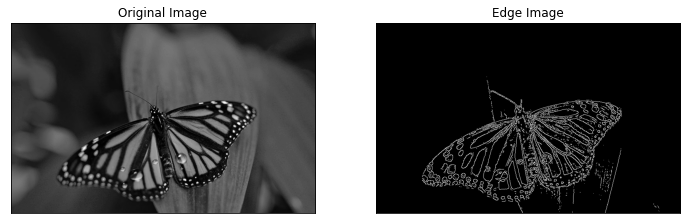

In [ ]:
img=imgY
edges = cv2.Canny(imgY,100,100)
plt.figure(figsize=[12,12])
plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()

(<matplotlib.axes._subplots.AxesSubplot at 0x7f64ab876890>,
 <matplotlib.image.AxesImage at 0x7f64ab776710>)

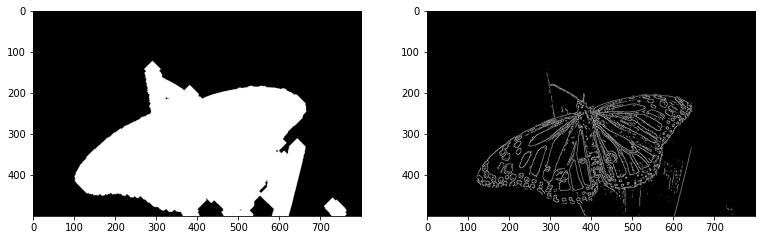

In [ ]:
kernel = morph.disk(1)
plt.figure(figsize=[20,20])
dilatacion = cv2.morphologyEx(edges, cv2.MORPH_DILATE, kernel, iterations =20)
plt.subplot(1,3,1),plt.imshow(dilatacion,cmap="gray")
plt.subplot(1,3,2),plt.imshow(edges,cmap="gray")  


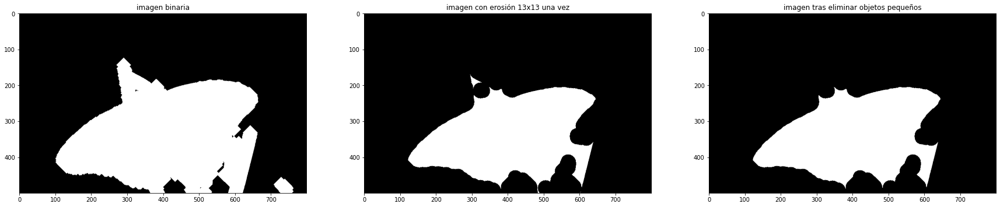

In [ ]:
selem = morph.disk(20) #mascara con discos de radio 14
erosion_once14 = morph.binary_erosion(dilatacion,selem)
#Aplicar la función de skimage de eliminación de objetos pequeños, seleccionando un área mínima
#con min_size y la conexión con los vecinos del píxel
objetos_pequeños_eliminados =morph.remove_small_objects(erosion_once14,min_size = 5000, connectivity = 2)
fig, ((ax1,ax2,ax3)) = plt.subplots(1,3, figsize=(30,20))
ax1.set_title('imagen binaria')
ax1.imshow(dilatacion, cmap='gray')
ax2.set_title('imagen con erosión 13x13 una vez')
ax2.imshow(erosion_once14, cmap='gray')
ax3.set_title('imagen tras eliminar objetos pequeños')
ax3.imshow(np.uint8(1*objetos_pequeños_eliminados), cmap='gray')

122 205


<function destroyAllWindows>

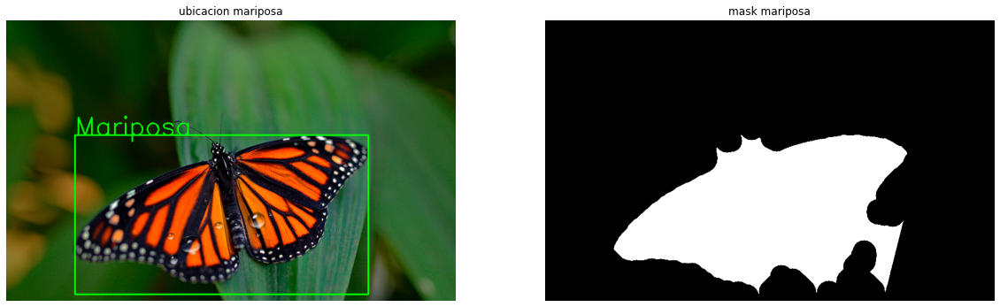

In [ ]:
objetos_pequeños_eliminados=np.uint8(1*objetos_pequeños_eliminados)
contours,herarquia=cv2.findContours(objetos_pequeños_eliminados, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)#eliminar puntos obvios
for c in contours:
  x,y,w,h=cv2.boundingRect(c)
  cv2.rectangle(image,(x,y),(x+w,y+h),(0,255,0),2)
  cv2.putText(image,"Mariposa",(x,y),cv2.FONT_HERSHEY_SIMPLEX,1.5,(0,255,0),2) 
  print(x,y)
plt.figure(figsize=[20,20])
plt.subplot(1,2,1),plt.imshow(image),plt.title("ubicacion mariposa"),plt.axis('off')
plt.subplot(1,2,2),plt.imshow(objetos_pequeños_eliminados,cmap="gray"),plt.title("mask mariposa"),plt.axis('off')
cv2.destroyAllWindows

#### Segmentacion(Metodo analisis de canal)

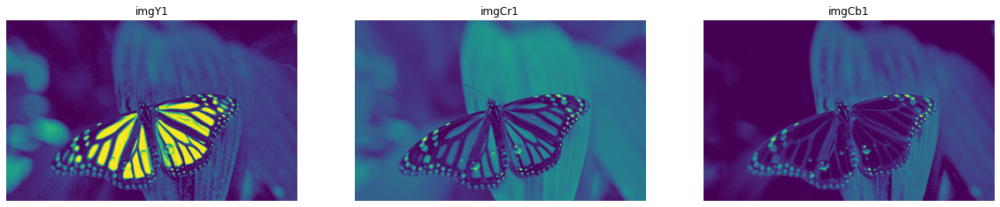

In [ ]:
imgY1=image_1[:,:,0]
imgCr1=image_1[:,:,1]
imgCb1=image_1[:,:,2]
j=list(image_1.shape)
list_title=["imgY1","imgCr1","imgCb1"]
plt.figure(figsize=[20,20])
for i in range(0,int(j[2])):
  plt.subplot(1,3,i+1),plt.imshow(image_1[:,:,i]),plt.title(list_title[i]),plt.axis('off')

(<matplotlib.image.AxesImage at 0x7f64ab2d6050>,
 Text(0.5, 1.0, 'Mascara umbral'),
 (-0.5, 799.5, 499.5, -0.5))

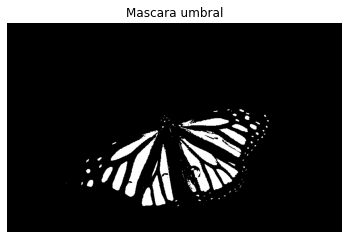

In [ ]:
image_edges1,thresh1=cv2.threshold(imgY1,200,250,cv2.THRESH_BINARY)
plt.imshow(thresh1,cmap="gray"),plt.title("Mascara umbral"),plt.axis('off')

(<matplotlib.axes._subplots.AxesSubplot at 0x7f64ab979090>,
 (-0.5, 799.5, 499.5, -0.5),
 Text(0.5, 1.0, 'Rellenos de bordes'))

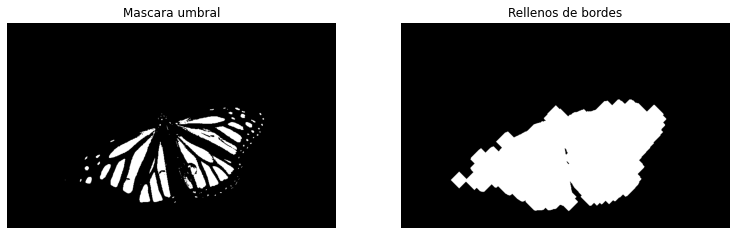

In [ ]:
kernel = morph.disk(1)
plt.figure(figsize=[20,20])
dilatacion= cv2.morphologyEx(thresh1, cv2.MORPH_DILATE, kernel, iterations =20)
plt.subplot(1,3,1),plt.imshow(thresh1,cmap="gray"),plt.axis('off'),plt.title("Mascara umbral")
plt.subplot(1,3,2),plt.imshow(dilatacion,cmap="gray"),plt.axis('off'),plt.title("Rellenos de bordes")

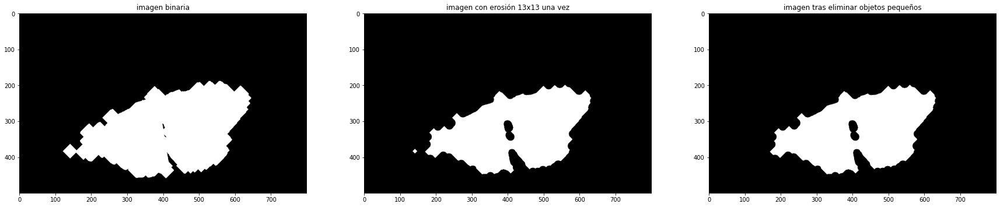

In [ ]:
selem = morph.disk(10) 
erosion_once14 = morph.binary_erosion(dilatacion,selem)
objetos_pequeños_eliminados = morph.remove_small_objects(erosion_once14,min_size = 5000, connectivity = 1)
fig, ((ax1,ax2,ax3)) = plt.subplots(1,3, figsize=(30,20))
ax1.set_title('imagen binaria')
ax1.imshow(dilatacion, cmap='gray')
ax2.set_title('imagen con erosión 13x13 una vez')
ax2.imshow(erosion_once14, cmap='gray')
ax3.set_title('imagen tras eliminar objetos pequeños')
ax3.imshow(objetos_pequeños_eliminados, cmap='gray')

170 199


(<matplotlib.axes._subplots.AxesSubplot at 0x7f64adcd0a50>,
 Text(0.5, 1.0, 'mask mariposa'),
 (-0.5, 799.5, 499.5, -0.5))

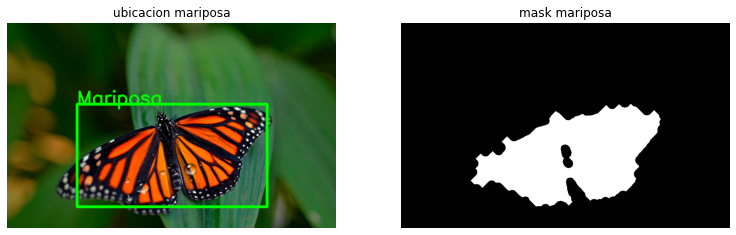

In [ ]:
mascara_filtrada=np.uint8(1*objetos_pequeños_eliminados)
contours,herarquia=cv2.findContours(mascara_filtrada, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)#eliminar puntos obvios
image_identificacion=image_1.copy()
for c in contours:
  x,y,w,h=cv2.boundingRect(c)
  cv2.rectangle(image_identificacion,(x,y),(x+w,y+h),(0,255,0),5)
  cv2.putText(image_identificacion,"Mariposa",(x,y),cv2.FONT_HERSHEY_SIMPLEX,1.5,(0,255,0),3) 
  print(x,y)
plt.figure(figsize=[20,20])
plt.subplot(131),plt.imshow(image_identificacion),plt.title("ubicacion mariposa"),plt.axis('off')
plt.subplot(132),plt.imshow(mascara_filtrada,cmap="gray"),plt.title("mask mariposa"),plt.axis('off')

**Funciones:** en este apartado se reduce los metodos de identificacion en dentro de una funcion, esto como objecto de analizar gran cantidad de imagenes

In [ ]:
def identificacion_canny(a):
  # for i in range(0,6):
    imgYCrCb=cv2.cvtColor(cv2.imread(a),cv2.COLOR_BGR2YCrCb)
    image=cv2.cvtColor(cv2.imread(a),cv2.COLOR_BGR2RGB)
    image_short=image.copy()
    imgY=imgYCrCb[:,:,0]
    imgCr=imgYCrCb[:,:,1]
    imgCb=imgYCrCb[:,:,2]
    edges = cv2.Canny(imgY,100,100)
    kernel = morph.disk(1)
    plt.figure(figsize=[20,20])
    dilatacion = cv2.morphologyEx(edges, cv2.MORPH_DILATE, kernel, iterations =20)
    selem = morph.disk(20) #mascara con discos de radio 14
    erosion_once14 = morph.binary_erosion(dilatacion,selem)
    objetos_pequeños_eliminados =morph.remove_small_objects(erosion_once14,min_size = 5000, connectivity = 2)
    objetos_pequeños_eliminados=np.uint8(1*objetos_pequeños_eliminados)
    contours,herarquia=cv2.findContours(objetos_pequeños_eliminados, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)#eliminar puntos obvio
    for c in contours:
      x,y,w,h=cv2.boundingRect(c)
      cv2.rectangle(image,(x,y),(x+w,y+w),(0,255,0),2)
      seg_image=image_short[y:y+w,x:x+w,:]
      cv2.putText(image,"Mariposa",(x,y),cv2.FONT_HERSHEY_SIMPLEX,1.5,(0,255,0),3) 
    return image,objetos_pequeños_eliminados,seg_image

In [ ]:
def identificacion_canal(a):
  # for i in range(0,6):
    imgYCrCb2=cv2.cvtColor(cv2.imread(a),cv2.COLOR_BGR2RGB)
    image_c=cv2.cvtColor(cv2.imread(a),cv2.COLOR_BGR2RGB)
    imgY2=imgYCrCb2[:,:,0]
    imgCr2=imgYCrCb2[:,:,1]
    imgCb2=imgYCrCb2[:,:,2]
    image_edges1,threshk=cv2.threshold(imgCr2,180,250,cv2.THRESH_BINARY)
    kernel = morph.disk(1)
    dilatacion1 = cv2.morphologyEx(threshk, cv2.MORPH_DILATE, kernel, iterations =20)
    selem = morph.disk(10) #mascara con discos de radio 14
    erosion_once13 = morph.binary_erosion(dilatacion1,selem)
    objetos_pequeños_eliminados1=morph.remove_small_objects(erosion_once13,min_size = 5000, connectivity = 2)
    objectos_detectados=np.uint8(1*objetos_pequeños_eliminados1)
    contours1,herarquia=cv2.findContours(objectos_detectados, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)#eliminar puntos obvio
    for c in contours1:
      x,y,w,h=cv2.boundingRect(c)
      cv2.rectangle(image_c,(x,y),(x+w,y+h),(0,255,0),2)
      cv2.putText(image_c,"Mariposa",(x,y),cv2.FONT_HERSHEY_SIMPLEX,1.5,(0,255,0),3) 
    return image_c,objectos_detectados#recorte


  

0


<Figure size 1440x1440 with 0 Axes>

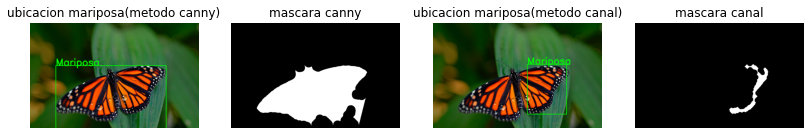

1


<Figure size 1440x1440 with 0 Axes>

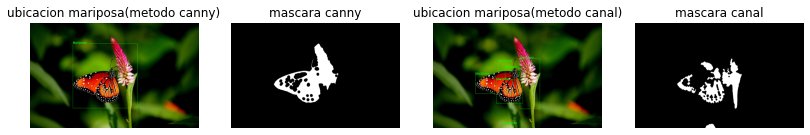

2


<Figure size 1440x1440 with 0 Axes>

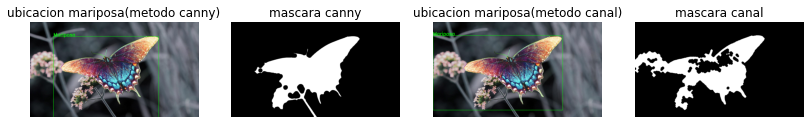

3


<Figure size 1440x1440 with 0 Axes>

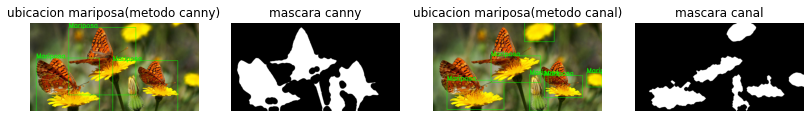

4


<Figure size 1440x1440 with 0 Axes>

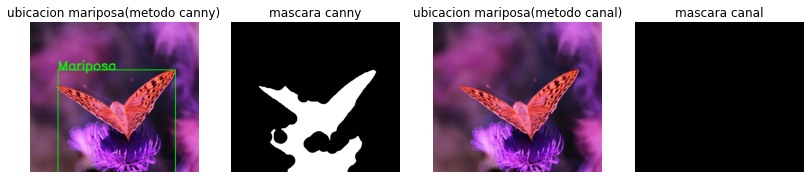

5


<Figure size 1440x1440 with 0 Axes>

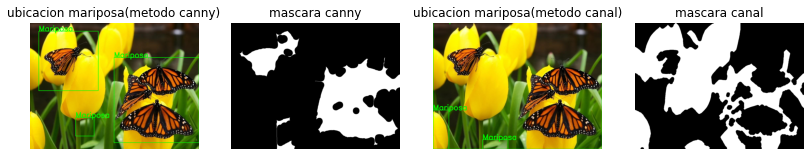

6


<Figure size 1440x1440 with 0 Axes>

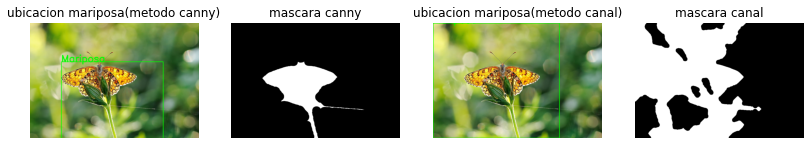

7


<Figure size 1440x1440 with 0 Axes>

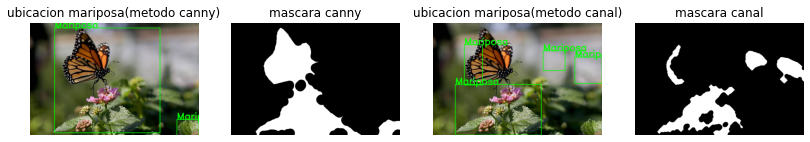

8


<Figure size 1440x1440 with 0 Axes>

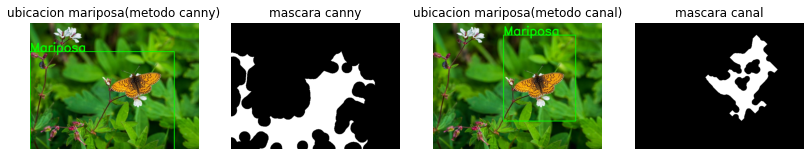

In [ ]:
n=9
H=[]
for i in range(0,n):
    print(i)
    name_archivo=str('/prueba'+str(i+1)+'.jpg')
    image,mask,recor=identificacion_canny(name_archivo)
    H.append(recor)
    image1,mask1=identificacion_canal(name_archivo)
    plt.figure(figsize=[50,50])
    plt.subplot(n+5,n+5,i+1),plt.imshow(image),plt.title("ubicacion mariposa(metodo canny)"),plt.axis('off')
    plt.subplot(n+5,n+5,i+2),plt.imshow(mask,cmap="gray"),plt.title("mascara canny"),plt.axis('off')
    plt.subplot(n+5,n+5,i+3),plt.imshow(image1),plt.title("ubicacion mariposa(metodo canal)"),plt.axis('off')
    plt.subplot(n+5,n+5,i+4),plt.imshow(mask1,cmap="gray"),plt.title("mascara canal"),plt.axis('off')
    plt.show()
  

### Método no convencional (BG REMOVE)

Uso de la libreria REMBG

Existen muchas herramientas graficas que puede usar para eliminar todo lo que rodea un objeto en una imagen. Sin embargo, hacer esto automaticamente es bastante complejo, debido a que, normalmente el usuario necesita interactuar con las herramientas muchas veces para eliminarlo lo mejor posible.

### Instalacion de la biblioteca REMBG 

In [ ]:
!pip install rembg 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 6.8 MB/s 
     |████████████████████████████████| 57 kB 6.3 MB/s 
     |████████████████████████████████| 96 kB 6.6 MB/s 
     |████████████████████████████████| 812 kB 49.8 MB/s 
     |████████████████████████████████| 4.9 MB 44.2 MB/s 
     |████████████████████████████████| 3.1 MB 64.4 MB/s 
     |████████████████████████████████| 47 kB 4.9 MB/s 
     |████████████████████████████████| 78 kB 8.4 MB/s 
     |████████████████████████████████| 13.5 MB 759 kB/s 
     |████████████████████████████████| 54 kB 3.7 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 78 kB 8.4 MB/s 
     |████████████████████████████████| 80 kB 10.7 MB/s 
     |████████████████████████████████| 63 kB 2.3 MB/s 
     |███████████████████████████████

### Importe de librerias y definición de funciones

Instalacion de la actualización de Pillow 

In [ ]:
!pip install Pillow==9.2.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np
import math
import skimage
import skimage.io
import skimage.data
import skimage.morphology as morph
import warnings
import PIL.Image
from scipy import ndimage as ndi
from skimage.segmentation import watershed
from skimage.morphology import disk
from skimage import data
from skimage.filters import rank
from skimage.util import img_as_ubyte
from rembg import remove #Para el REMBG
from PIL import Image #Para el REMBG
from os import path
from skimage.transform import resize
warnings.filterwarnings('ignore')

In [ ]:
#En este code se define una función que facilitara la lectura de imágenes
#Leer la imagen en RGB o escala de grises con una sola línea de código
def img_read(filename, mode = 'color'):
    if(mode == 'color'):   
        return cv2.cvtColor(cv2.imread(filename),cv2.COLOR_BGR2RGB)
    elif(mode=='grayscale' or mode=='greyscale' or mode == 'gray' or mode == 'grey'):
        return cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
    else:
        return None

In [ ]:
# Función para mostrar imágen
def show_image(img):
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(img, cmap='gray')
    ax.set_axis_off()
    plt.tight_layout()
    plt.show()

In [ ]:
#Now PIL.Image.Resampling.BICUBIC siempre sea reconocido sin importar la versión del Pillow
if not hasattr(PIL.Image, 'Resampling'):  # Pillow<9.0
  PIL.Image.Resampling = PIL.Image
  

### Uso de la libreria REMBG

Importado del paquete de imagenes

In [ ]:
#Importe token activación de kaggle
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
path_base = "/content/drive/Shareddrives/Vision Artificial/imagen_prueba"

Downloading...
From: https://drive.google.com/uc?id=1tCU5MM1LhRgGou5OpmpjBQbSrYIUoYab
To: /root/.u2net/u2net.onnx
100%|██████████| 176M/176M [00:03<00:00, 54.4MB/s]


/content/drive/Shareddrives/Vision Artificial/imagen_prueba/prueba1.jpg


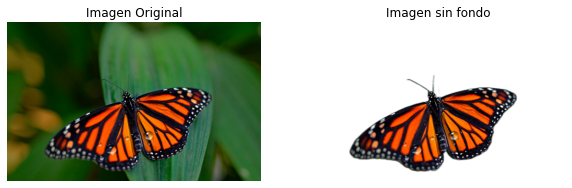

/content/drive/Shareddrives/Vision Artificial/imagen_prueba/prueba2.jpg


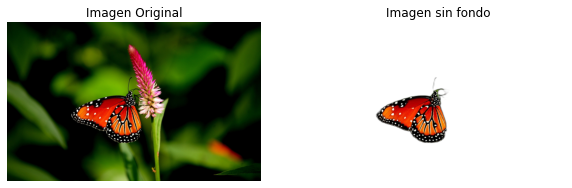

/content/drive/Shareddrives/Vision Artificial/imagen_prueba/prueba3.jpg


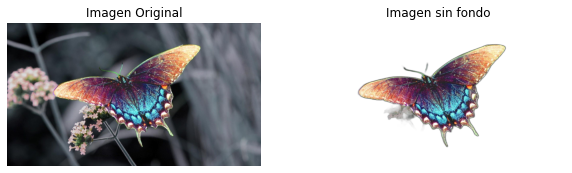

/content/drive/Shareddrives/Vision Artificial/imagen_prueba/prueba4.jpg


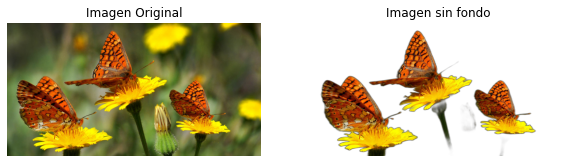

/content/drive/Shareddrives/Vision Artificial/imagen_prueba/prueba5.jpg


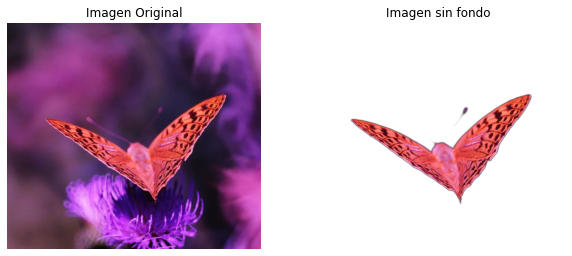

/content/drive/Shareddrives/Vision Artificial/imagen_prueba/prueba6.jpg


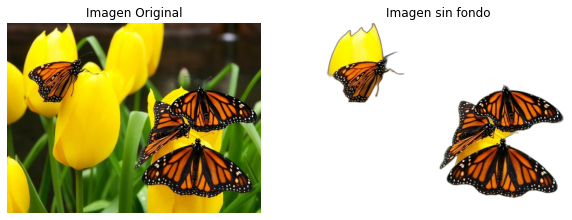

/content/drive/Shareddrives/Vision Artificial/imagen_prueba/prueba7.jpg


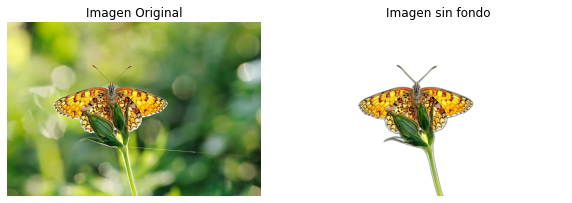

/content/drive/Shareddrives/Vision Artificial/imagen_prueba/prueba8.jpg


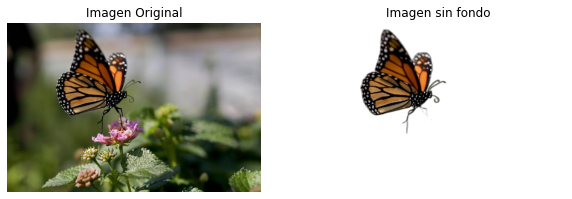

In [ ]:
n=9
images=[]
images_bg_removed = []
for i in range(1,n):
    name_archivo = path.join(path_base, str('prueba'+str(i)+'.jpg'))
    image = cv2.cvtColor(cv2.imread(name_archivo),cv2.COLOR_BGR2RGB)
    image_bg_removed = remove(Image.fromarray(image))
    images_bg_removed.append(image_bg_removed)
    print(name_archivo)
    images.append(image)
    plt.figure(figsize=[10,10])
    plt.subplot(1,2,1), plt.imshow(image),plt.axis('off'),plt.title('Imagen Original')
    plt.subplot(1,2,2), plt.imshow(image_bg_removed),plt.axis('off'),plt.title('Imagen sin fondo')
    plt.show()

images2 = images

**Creación de la mascara**
Luego del borrado del fondo basta con convertir la imagen a escala de grises para posteriormente binarizarla y así obtenemos la más cara

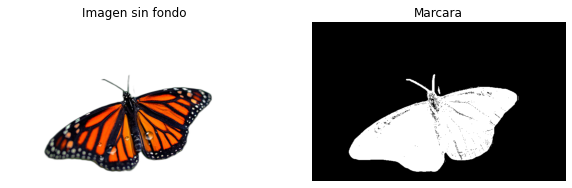

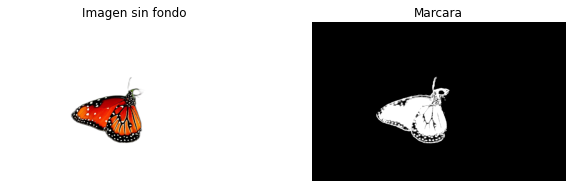

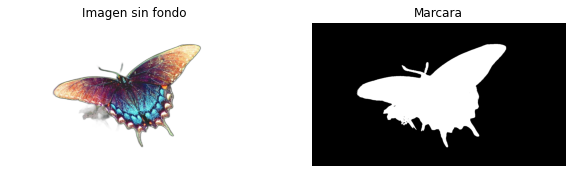

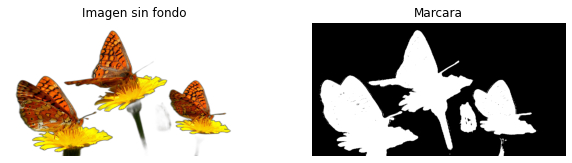

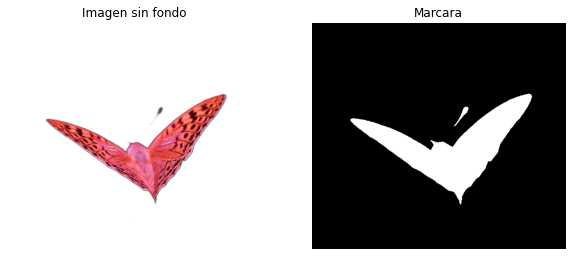

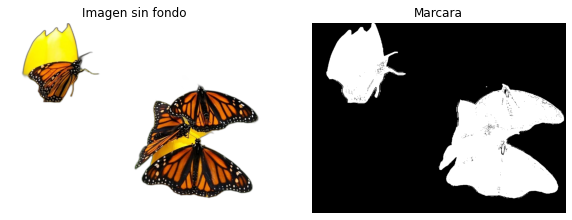

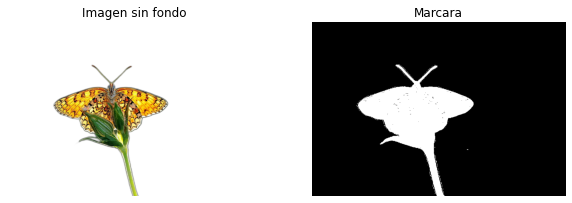

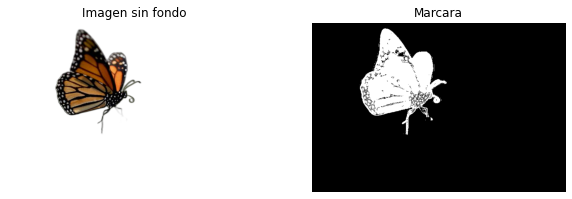

In [ ]:
images_bin = []
for img in images_bg_removed:
  im_gray = cv2.cvtColor(np.asarray(img), cv2.COLOR_RGB2GRAY)
  thresh = 1
  im_bw = cv2.threshold(im_gray, thresh, 255, cv2.THRESH_BINARY)[1]
  images_bin.append(im_bw)
  plt.figure(figsize=[10,10])
  plt.subplot(1,2,1), plt.imshow(img),plt.axis('off'),plt.title('Imagen sin fondo')
  plt.subplot(1,2,2), plt.imshow(im_bw, cmap='gray', vmin = 0, vmax = 255),plt.axis('off'),plt.title('Marcara')
  plt.show()

Otra alternativa para la obtención de la máscara es por medio de la selección de canal entre el HSV donde notamos que el canal S proporciona una mejor segmentación entre los colores:

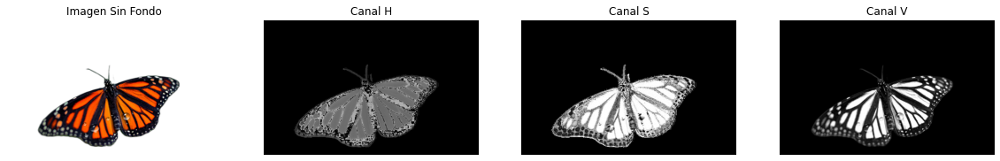

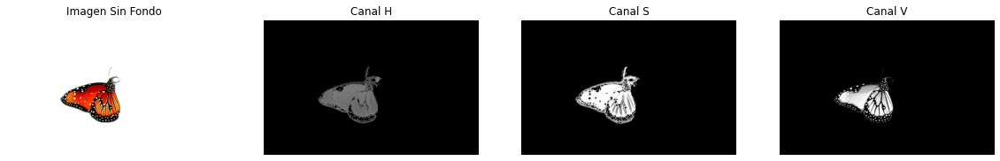

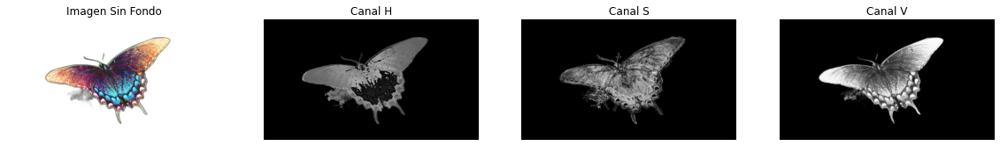

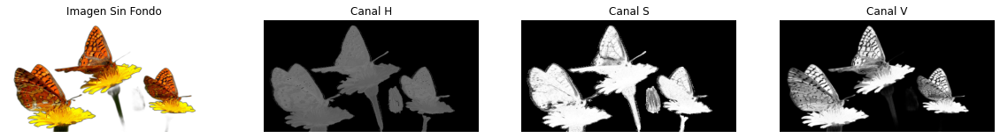

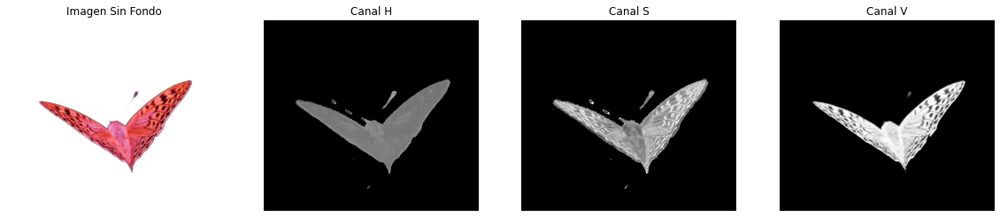

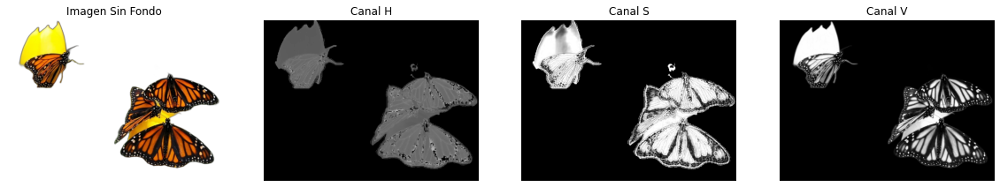

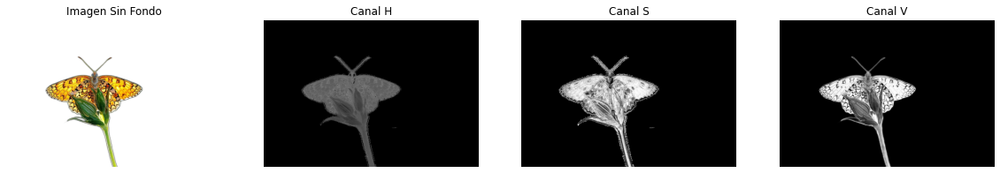

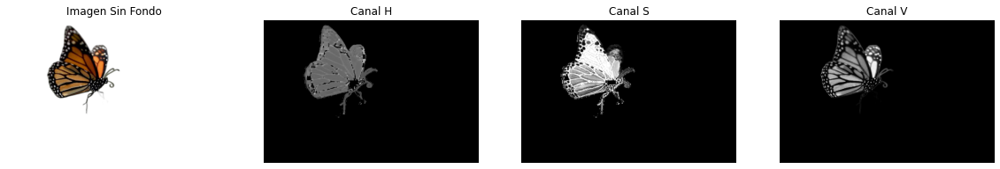

In [ ]:
# Convertir imagen a HSV
#images_hsv = [cv2.cvtColor(img, cv2.COLOR_BGR2HSV) for img in images]

for img in images_bg_removed:
  img_hsv = cv2.cvtColor(np.asarray(img), cv2.COLOR_BGR2HSV)
  img_h = img_hsv[:, : , 0]
  img_s = img_hsv[:, : , 1]  
  img_v = img_hsv[:, : , 2]
  plt.figure(figsize=[20,20])
  plt.subplot(1,4,1), plt.imshow(img),plt.axis('off'),plt.title('Imagen Sin Fondo')
  plt.subplot(1,4,2), plt.imshow(img_h, cmap='gray', vmin = 0, vmax = 255),plt.axis('off'),plt.title('Canal H')
  plt.subplot(1,4,3), plt.imshow(img_s, cmap='gray', vmin = 0, vmax = 255),plt.axis('off'),plt.title('Canal S')
  plt.subplot(1,4,4), plt.imshow(img_v, cmap='gray', vmin = 0, vmax = 255),plt.axis('off'),plt.title('Canal V')
  plt.show()

Se elegiría el espacio de color HSV, en su canal S, debido a que separa muy bien los elementos de la mariposa por color de su entorno

**Morfología**

Para mejorar la más cara primero realziamos una dilatación con un disco de tamaño 20 y luego eliminamos los objetos pequeños que quedan aislados del objeto principal

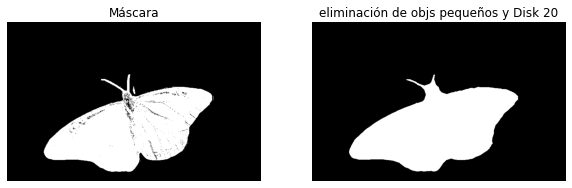

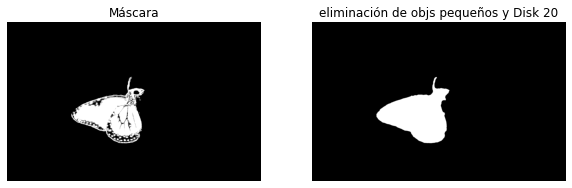

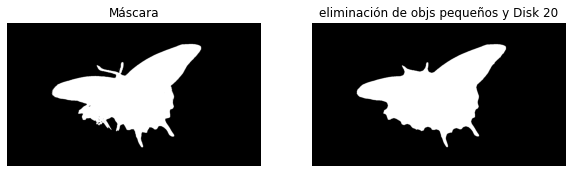

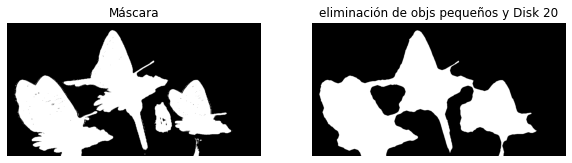

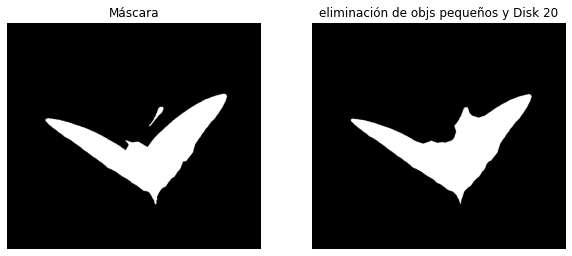

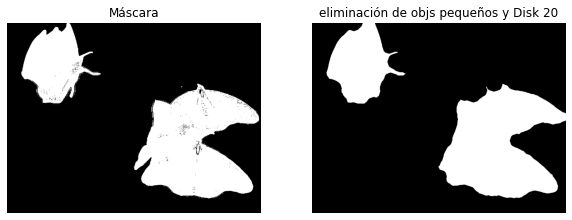

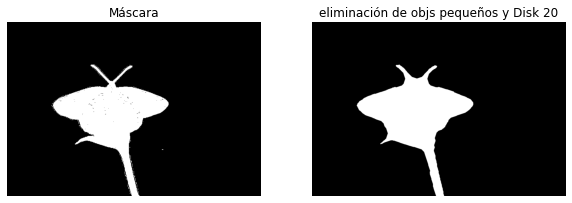

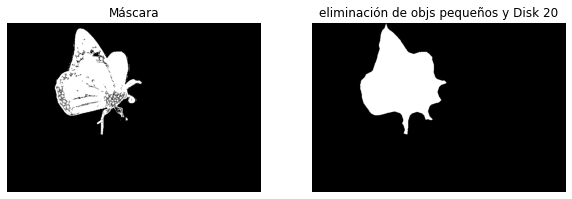

In [ ]:
# Aplicar operaciones morfológicas

# Probamso con un kernel de disco de tamaño 20
kernel2 = morph.disk(20)

#Kernel cierre
kernelC = morph.disk(5)

# Definición de los objetos pequeños
selem = morph.disk(1)

images_objs = []

for img in images_bin:
  cierre= cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernelC, iterations= 5)
  erosion_once = morph.binary_erosion(cierre,selem)
  img_objs = morph.remove_small_objects(erosion_once, min_size = 50, connectivity = 1)
  #dilatacion2 = morph.binary_dilation(img_objs,kernel2)
  #images_objs.append(dilatacion2)
  images_objs.append(img_objs)
  plt.figure(figsize=[10,10])
  plt.subplot(1,2,1), plt.imshow(img, cmap='gray', vmin = 0, vmax = 255),plt.axis('off'),plt.title('Máscara')
  #plt.subplot(1,2,2), plt.imshow(dilatacion2, cmap='gray'),plt.axis('off'),plt.title('eliminación de objs pequeños y Disk 20')
  plt.subplot(1,2,2), plt.imshow(img_objs, cmap='gray'),plt.axis('off'),plt.title('eliminación de objs pequeños y Disk 20')
  plt.show()

Bounding Box

In [ ]:
# Cambio de unidades

for i in range(len(images_objs)):
  images_objs[i] =  np.uint8(1*images_objs[i])

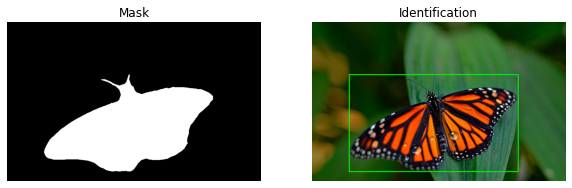

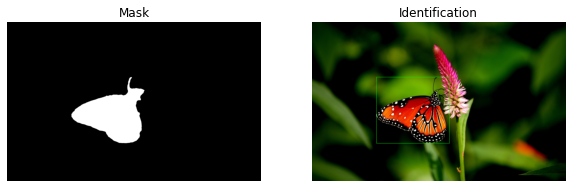

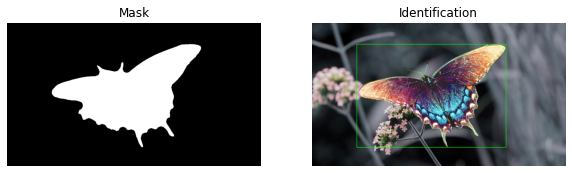

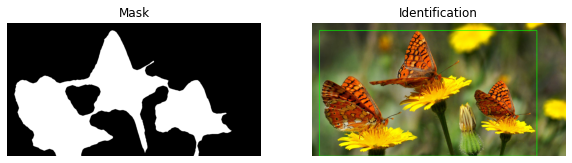

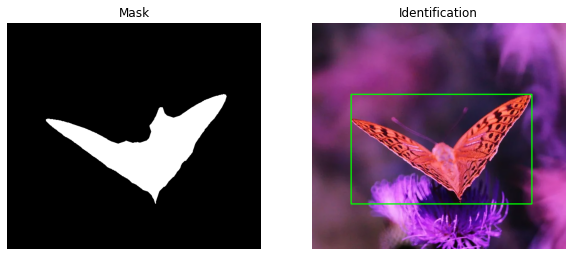

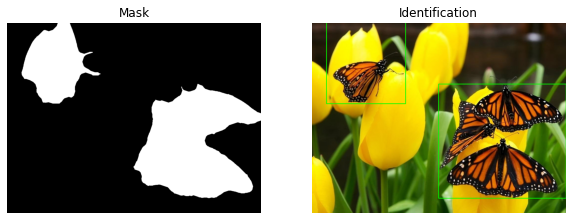

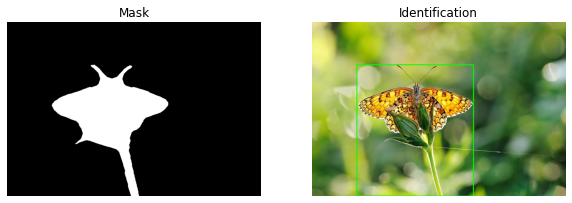

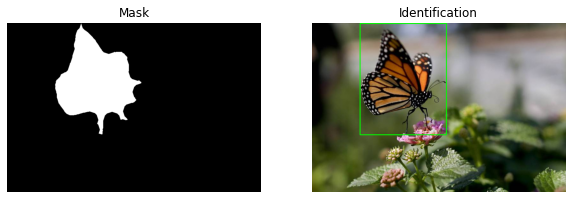

In [ ]:
images_seg = []

for img1, img2, img3 in zip(images_objs, images, images2):
  # Hallamos los contornos de las imagenes
  contours, hierarchy = cv2.findContours(img1.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  # Se recorren todos los contornos encontrados y segmento la imagen original
  for c in contours:
      x,y,w,h = cv2.boundingRect(c) # Encuentro el rectángulo que engloba al contorno
      seg_image = img3[y:y+w,x:x+w]
      images_seg.append(seg_image)
      img2 = cv2.rectangle(img2,(x,y),(x+w,y+h),(0,255,0),2) # Dibujo el rectángulo en la imagen original
  plt.figure(figsize=[10,10])
  plt.subplot(1,2,1), plt.imshow(img1, cmap='gray'),plt.axis('off'),plt.title('Mask')
  plt.subplot(1,2,2), plt.imshow(img2),plt.axis('off'),plt.title('Identification')
  plt.show()

**Segmentación**



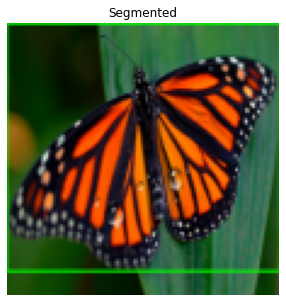

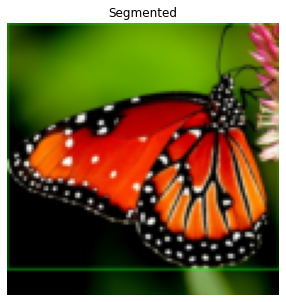

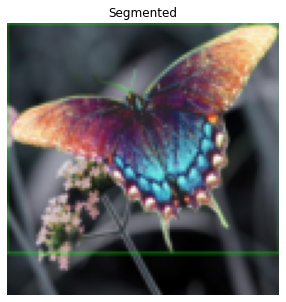

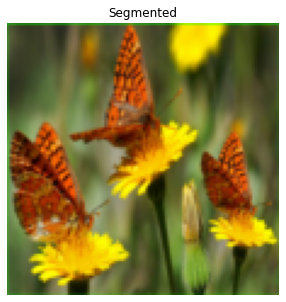

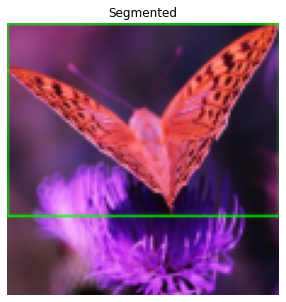

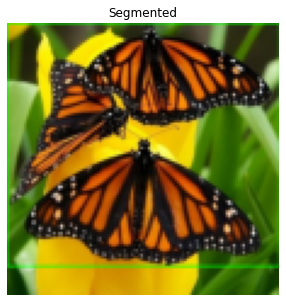

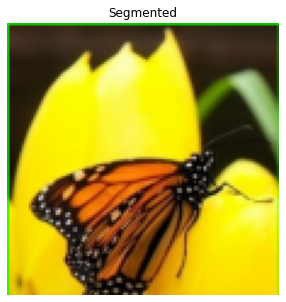

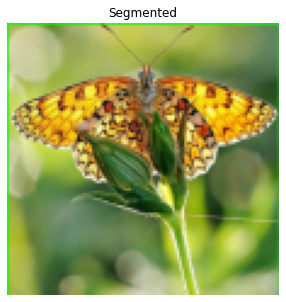

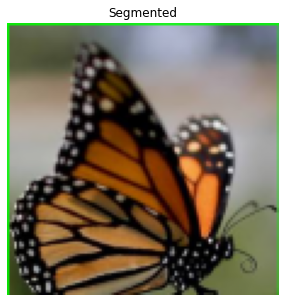

In [ ]:
images2predict = []

for img in images_seg:
  pred = resize(img,(112,112),anti_aliasing=True)
  images2predict.append(pred)
  plt.figure(figsize=[5,5])
  plt.imshow(pred),plt.axis('off'),plt.title('Segmented')
  plt.show()


# Clasificación (Red Neuronal Convolucional)

**texto en negrita**## Imports 

Se debe importar el archivo kaggle.json el cual es el token de activación para poder consumir el servicio de la API de Kaggle.

In [ ]:
!pip install tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#Importe de librerías
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import pandas as pd
import itertools
import math
import os
import cv2
import pathlib
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report, accuracy_score, f1_score, recall_score, precision_score
# scikit-image
from skimage import io 
from skimage.transform import rescale, resize, downscale_local_mean
from random import randint, choice, choices
from tensorflow import keras
from PIL import Image

In [ ]:
#Intalación kaggle
!pip install  -q kaggle

In [ ]:
#Importe token activación de kaggle
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_path = pathlib.Path('/content/drive/Shareddrives/Vision Artificial')
list(data_path.glob('*.json'))

[PosixPath('/content/drive/Shareddrives/Vision Artificial/kaggle.json')]

In [ ]:
#Creación del directorio kaggle
! mkdir ~/.kaggle

In [ ]:
#Copia del token de activación
! cp '/content/drive/Shareddrives/Vision Artificial/kaggle.json' ~/.kaggle/

In [ ]:
#Listado de datasets de kaggle
! kaggle datasets list

ref                                                            title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
-------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
akshaydattatraykhare/diabetes-dataset                          Diabetes Dataset                                      9KB  2022-10-06 08:55:25          16190        471  1.0              
akshaydattatraykhare/data-for-admission-in-the-university      Data for Admission in the University                  4KB  2022-10-27 11:05:45           4143         98  1.0              
thedevastator/jobs-dataset-from-glassdoor                      Salary Prediction                                     3MB  2022-11-16 13:52:31            691         25  1.0              
swaptr/layoffs-2022                                            La

In [ ]:
#Importe del dataset mariposas
! kaggle datasets download -d gpiosenka/butterfly-images40-species

 98% 443M/454M [00:07<00:00, 55.1MB/s]
100% 454M/454M [00:07<00:00, 60.7MB/s]


In [ ]:
#Descompresión
!unzip butterfly-images40-species.zip

Se truncaron las últimas líneas 5000 del resultado de transmisión.
  inflating: train/MILBERTS TORTOISESHELL/111.jpg  
  inflating: train/MILBERTS TORTOISESHELL/112.jpg  
  inflating: train/MILBERTS TORTOISESHELL/113.jpg  
  inflating: train/MILBERTS TORTOISESHELL/114.jpg  
  inflating: train/MILBERTS TORTOISESHELL/115.jpg  
  inflating: train/MILBERTS TORTOISESHELL/116.jpg  
  inflating: train/MILBERTS TORTOISESHELL/117.jpg  
  inflating: train/MILBERTS TORTOISESHELL/118.jpg  
  inflating: train/MILBERTS TORTOISESHELL/119.jpg  
  inflating: train/MILBERTS TORTOISESHELL/120.jpg  
  inflating: train/MILBERTS TORTOISESHELL/121.jpg  
  inflating: train/MILBERTS TORTOISESHELL/122.jpg  
  inflating: train/MILBERTS TORTOISESHELL/123.jpg  
  inflating: train/MILBERTS TORTOISESHELL/124.jpg  
  inflating: train/MILBERTS TORTOISESHELL/125.jpg  
  inflating: train/MILBERTS TORTOISESHELL/126.jpg  
  inflating: train/MILBERTS TORTOISESHELL/127.jpg  
  inflating: train/MILBERTS TORTOISESHELL/128.jpg


## Función carga de imágenes 

In [ ]:
list = os.listdir('/content/test')
# Diccionario de clases
clases = dict(zip(list, range(75)))

In [ ]:
#Funcion carga de imágenes en arrays

def load_images(dir_name, claseslist):  
    train = []
    test = []
    valid = []
    labels_train = []
    labels_train_long = []
    labels_test = []
    labels_test_long = []
    labels_valid = []

    for label in claseslist:
        with os.scandir(os.path.join(os.path.join(dir_name, 'train'), label)) as items:
          archives = [fichero.name for fichero in items if fichero.is_file()]
        archives.sort(key=str.lower)
        for archive in archives:
          labels_train.append(label)
          labels_train_long.append(os.path.join(label, archive))
          train.append(io.imread(os.path.join(os.path.join(dir_name, 'train'), os.path.join(label, archive))))
        with os.scandir(os.path.join(os.path.join(dir_name, 'test'), label)) as items:
          archives = [fichero.name for fichero in items if fichero.is_file()]
        archives.sort(key=str.lower)
        for archive in archives:
          labels_test.append(label)
          labels_test_long.append(os.path.join(label, archive))
          test.append(io.imread(os.path.join(os.path.join(dir_name, 'test'), os.path.join(label, archive))))
        with os.scandir(os.path.join(os.path.join(dir_name, 'valid'), label)) as items:
          archives = [fichero.name for fichero in items if fichero.is_file()]
        archives.sort(key=str.lower)
        for archive in archives:
          labels_valid.append(label)
          valid.append(io.imread(os.path.join(os.path.join(dir_name, 'valid'), os.path.join(label, archive))))

    return train, test, valid, labels_train, labels_train_long, labels_test, labels_test_long, labels_valid

## Selección de clases.

In [ ]:
# N: número de clases que se desean usar (1-50)
N = 75

# Toma las primeras N clases
# claseslist = [key for key in clases.keys()][:N]

# Toma N clases aleatorias
claseslist = []
while(len(claseslist)<N):
  clase = choice([key for key in clases.keys()])
  if clase not in claseslist:
    claseslist.append(clase)
claseslist.sort()

pd.DataFrame(claseslist, columns=['Labels'])

,Labels
0,AFRICAN GIANT SWALLOWTAIL
1,AMERICAN SNOOT
2,AN 88
3,ARCIGERA FLOWER MOTH
4,ATALA
...,...
70,TWO BARRED FLASHER
71,ULYSES
72,VICEROY
73,WHITE LINED SPHINX MOTH


## Carga de imágenes

In [ ]:
train, test, valid, labels_train, labels_train_long, labels_test, labels_test_long, labels_valid = load_images('', claseslist)

In [ ]:
print(len(train))
print(len(test))
print(len(valid))

9565
375
375


## Vista previa de las imágenes

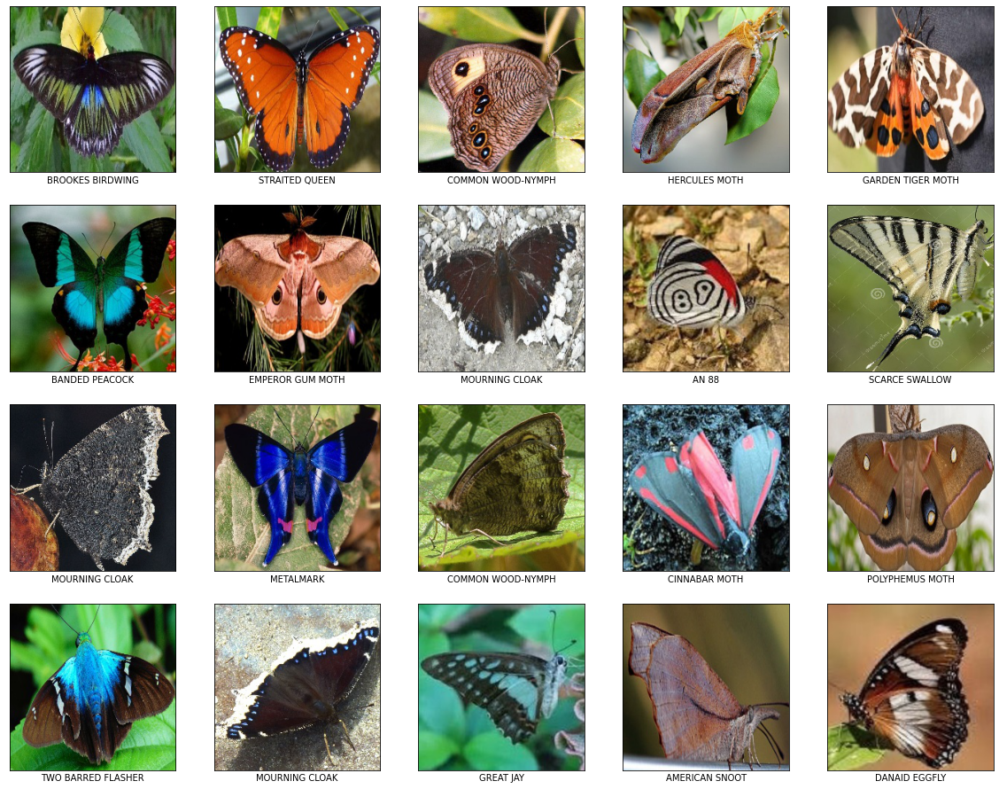

In [ ]:
plt.figure(figsize=(20,20))
ramlist = []
for i in range(20):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    ramlist.append(randint(0,len(train)))
    plt.grid(False)
    plt.imshow(train[ramlist[i]])
    plt.xlabel(labels_train[ramlist[i]])
plt.show()

## Redimensionamiento de las imágenes

In [ ]:
# Resize de las imágenes

# P: Nuevo número de pixeles al cuadrado (P^2 = PXP) de las imagenes (1-224)
P = 112

# R: Reescalado de las imagenes en porcentaje (0-1)
# R = 0.125

auxtrain = []
for img in train:
  #auxtrain.append(rescale(img, (R, R, 1), anti_aliasing=False))
  auxtrain.append(resize(img, (P, P), anti_aliasing=True))
train.clear()
train = auxtrain.copy()

auxtest = []
for img in test:
  #auxtest.append(rescale(img, (R, R, 1), anti_aliasing=False))
  auxtest.append(resize(img, (P, P), anti_aliasing=True))
test.clear()
test = auxtest.copy()

auxvalid = []
for img in valid:
  #auxvalid.append(rescale(img, (R, R, 1), anti_aliasing=False))
  auxvalid.append(resize(img, (P, P), anti_aliasing=True))
valid.clear()
valid = auxvalid.copy()

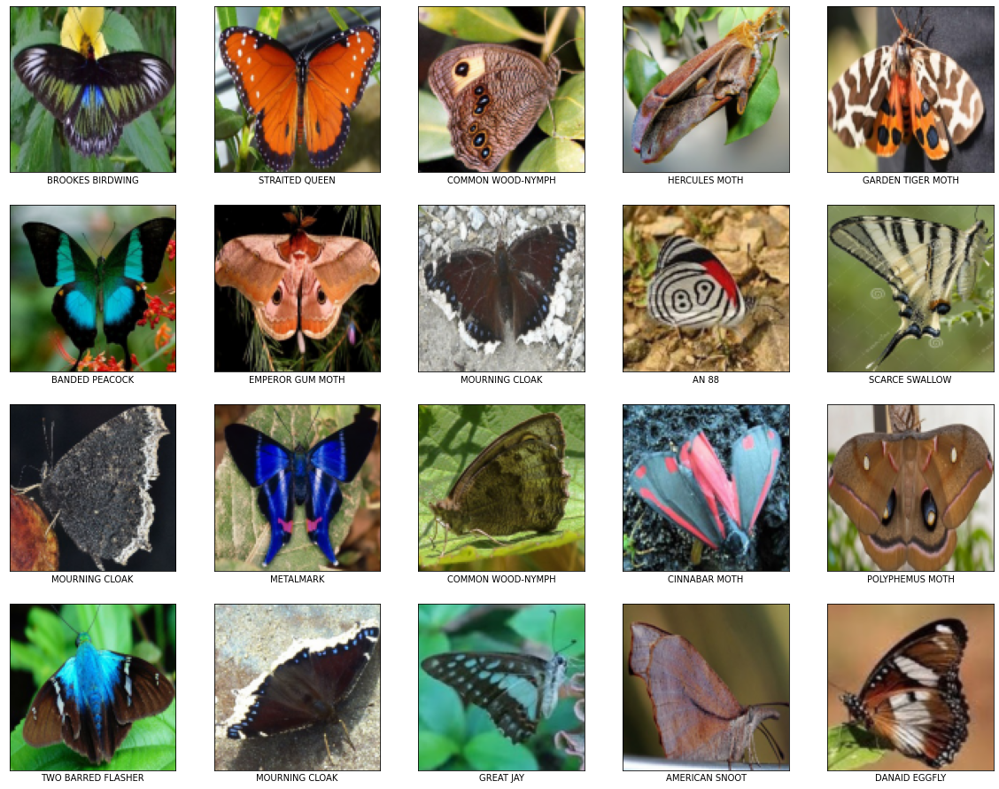

In [ ]:
plt.figure(figsize=(20,20))
for i in range(20):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train[ramlist[i]])
    plt.xlabel(labels_train[ramlist[i]])
plt.show()

## Categorización de las clases

In [ ]:
# Vuelve las clases categóricas

label_train_cat=[]
for i in labels_train:
  label_train_cat.append(claseslist.index(i))
label_train_cat=np.array(label_train_cat)

label_test_cat=[]
for i in labels_test:
  label_test_cat.append(claseslist.index(i))
label_test_cat=np.array(label_test_cat)

label_valid_cat=[]
for i in labels_valid:
  label_valid_cat.append(claseslist.index(i))
label_valid_cat=np.array(label_valid_cat)


In [ ]:
# Pasa de list a np.array

train=np.array(train)
test=np.array(test)
valid=np.array(valid)

#Convertir a flotante y normalizar para que aprenda mejor la red
# train = train.astype('float32') / 255
# test = test.astype('float32') / 255
# valid = valid.astype('float32') / 255

## Definición del módelo

Se define un modelo con 4 capas convoluciones con función de activación relu, y se definen los Kernels como una potencia a la 2 a partir de 2^5 (siempre creciente) 
luego se define una capa de dropout al 0.5, y una capa de vuelve la imagen de una sola dimensión, para finalizar con dos capas densas, una Relu nuevamente y una softmax que nos dará el porcentaje de pertenencia de una imagen a las 50 clases.

In [ ]:
model = keras.Sequential([
    keras.layers.Conv2D(32, (3,3), input_shape=(P, P, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(256, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4096, activation='relu'),
    tf.keras.layers.Dense(N, activation="softmax")
    
])

In [ ]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

## Entrenamiento del módelo

In [ ]:
history=model.fit(train, label_train_cat, epochs=20)  

Epoch 1/20
395/395 [==============================] - 460s 1s/step - loss: 3.2286 - accuracy: 0.2226
Epoch 2/20
395/395 [==============================] - 456s 1s/step - loss: 1.6771 - accuracy: 0.5534
Epoch 3/20
395/395 [==============================] - 454s 1s/step - loss: 1.1428 - accuracy: 0.6785
Epoch 4/20
395/395 [==============================] - 462s 1s/step - loss: 0.8129 - accuracy: 0.7645
Epoch 5/20
395/395 [==============================] - 452s 1s/step - loss: 0.5829 - accuracy: 0.8228
Epoch 6/20
395/395 [==============================] - 445s 1s/step - loss: 0.4426 - accuracy: 0.8683
Epoch 7/20
395/395 [==============================] - 447s 1s/step - loss: 0.3370 - accuracy: 0.8960
Epoch 8/20
395/395 [==============================] - 443s 1s/step - loss: 0.2707 - accuracy: 0.9161
Epoch 9/20
395/395 [==============================] - 444s 1s/step - loss: 0.2430 - accuracy: 0.9281
Epoch 10/20
395/395 [==============================] - 448s 1s/step - loss: 0.2132 - accura

## Predicciones

### **Test**

In [ ]:
test_loss, test_acc = model.evaluate(test, label_test_cat)

print('Test accuracy:', test_acc)

12/12 [==============================] - 0s 18ms/step - loss: 0.7353 - accuracy: 0.8533
Test accuracy: 0.8533333539962769


In [ ]:
predictions_test = model.predict(test)
pruebas = [randint(0,len(predictions_test)-1) for i in range(20)]
a=[]
b=[]
c=[]
for i in pruebas:
  a.append(claseslist[np.argmax(predictions_test[i])])
  b.append(claseslist[label_test_cat[i]])
  c.append(claseslist[np.argmax(predictions_test[i])]==claseslist[label_test_cat[i]])

pd.DataFrame(zip(a,b,c), columns=['Predicción','Valor real','Comparación'])

12/12 [==============================] - 0s 8ms/step


,Predicción,Valor real,Comparación
0,ZEBRA LONG WING,ZEBRA LONG WING,True
1,MOURNING CLOAK,ROSY MAPLE MOTH,False
2,MONARCH,VICEROY,False
3,SOUTHERN DOGFACE,SOUTHERN DOGFACE,True
4,IO MOTH,IO MOTH,True
5,CHECQUERED SKIPPER,CHECQUERED SKIPPER,True
6,INDRA SWALLOW,INDRA SWALLOW,True
7,BANDED TIGER MOTH,BANDED TIGER MOTH,True
8,COPPER TAIL,COPPER TAIL,True
9,HUMMING BIRD HAWK MOTH,CLEARWING MOTH,False


### **Validación**

In [ ]:
test_loss, test_acc = model.evaluate(valid, label_valid_cat)

print('Test accuracy:', test_acc)

12/12 [==============================] - 0s 9ms/step - loss: 0.8550 - accuracy: 0.8240
Test accuracy: 0.8240000009536743


In [ ]:
predictions_valid = model.predict(valid)
pruebas = [randint(0,len(predictions_valid)-1) for i in range(20)]
a=[]
b=[]
c=[]
for i in pruebas:
  a.append(claseslist[np.argmax(predictions_valid[i])])
  b.append(claseslist[label_valid_cat[i]])
  c.append(claseslist[np.argmax(predictions_valid[i])]==claseslist[label_valid_cat[i]])

pd.DataFrame(zip(a,b,c), columns=['Predicción','Valor real','Comparación'])

12/12 [==============================] - 0s 7ms/step


,Predicción,Valor real,Comparación
0,GREEN HAIRSTREAK,GREEN HAIRSTREAK,True
1,CLODIUS PARNASSIAN,CLODIUS PARNASSIAN,True
2,BLUE SPOTTED CROW,BLUE SPOTTED CROW,True
3,INDRA SWALLOW,INDRA SWALLOW,True
4,CHALK HILL BLUE,CHALK HILL BLUE,True
5,SCARCE SWALLOW,INDRA SWALLOW,False
6,MILBERTS TORTOISESHELL,MILBERTS TORTOISESHELL,True
7,ARCIGERA FLOWER MOTH,INDRA SWALLOW,False
8,AFRICAN GIANT SWALLOWTAIL,AFRICAN GIANT SWALLOWTAIL,True
9,ORCHARD SWALLOW,ORCHARD SWALLOW,True


### **Predicciones Reales**

Se realizan las predicciones con las imagenes que fueron obtenidas de la identificación de las mariposas, lo que lo hace realmente significativo y era el punto al que se deseaba llegar.

1/1 [==============================] - 0s 17ms/step


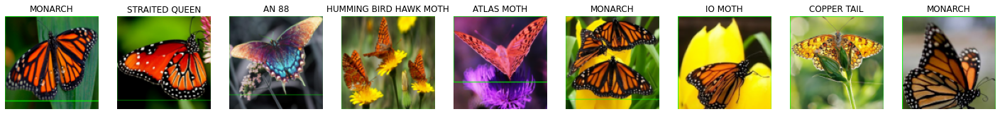

In [ ]:
plt.figure(figsize=(25,25))
DF = []
for i in range(len(images2predict)):
  predic = model.predict(np.array(images2predict[i], ndmin=4))

  plt.subplot(1,len(images2predict),i+1), plt.imshow(images2predict[i]),plt.axis('off'),plt.title('Imagen Sin Fondo')
  plt.title(claseslist[np.argmax(predic[0])])

  prediction1por = map(lambda x: x * 100, predic[0])

  prediction1df = pd.DataFrame(zip(claseslist,prediction1por), columns=['Clase', 'Predicción (%)'])
  prediction1df.sort_values('Predicción (%)', ascending=False, inplace=True)
  DF.append(prediction1df[:5])

In [ ]:
for i in range(len(DF)):
  print('imagen', i+1)
  print(DF[i])
  print('--------')

imagen 1
                       Clase  Predicción (%)
50                   MONARCH       99.183053
6   BANDED ORANGE HELICONIAN        0.535870
72                   VICEROY        0.280936
68            STRAITED QUEEN        0.000099
25             CRIMSON PATCH        0.000019
--------
imagen 2
                Clase  Predicción (%)
68     STRAITED QUEEN    1.000000e+02
72            VICEROY    2.594437e-08
50            MONARCH    2.712899e-10
11  BLUE SPOTTED CROW    1.203488e-10
56            PEACOCK    6.816540e-12
--------
imagen 3
                 Clase  Predicción (%)
2                AN 88       84.767747
48           METALMARK        5.203446
63  RED SPOTTED PURPLE        4.985372
62         RED CRACKER        1.708305
4                ATALA        1.003518
--------
imagen 4
                     Clase  Predicción (%)
39  HUMMING BIRD HAWK MOTH       26.148582
13             BROWN ARGUS       22.747755
47                  MESTRA       17.212382
18           CINNABAR MOTH       

## Métricas de Desempeño

In [ ]:
decoded_predictions = predictions_valid.argmax(axis=1)

# Cálculo del reporte de clasificación

print(f'Reporte de clasificación:')
print(classification_report(label_valid_cat,
                            decoded_predictions))
 


Reporte de clasificación:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         5
           1       0.75      0.60      0.67         5
           2       1.00      1.00      1.00         5
           3       0.83      1.00      0.91         5
           4       1.00      1.00      1.00         5
           5       0.71      1.00      0.83         5
           6       1.00      1.00      1.00         5
           7       1.00      0.80      0.89         5
           8       0.83      1.00      0.91         5
           9       0.83      1.00      0.91         5
          10       1.00      0.20      0.33         5
          11       1.00      0.60      0.75         5
          12       1.00      0.80      0.89         5
          13       0.71      1.00      0.83         5
          14       1.00      1.00      1.00         5
          15       1.00      0.80      0.89         5
          16       0.83      1.00      0.91         5
 

### Calculo de exactitud (Accuracy)

In [ ]:
# Cálculo de accuracy
print(f'Exactitud (accuracy): {accuracy_score(label_valid_cat, decoded_predictions)}')

Exactitud (accuracy): 0.824


### Cálculo de precisión

In [ ]:
# Cálculo de precisión
print(f'Precisión (micro): {precision_score(label_valid_cat, decoded_predictions, average="micro")}')
print(f'Precisión (macro): {precision_score(label_valid_cat, decoded_predictions, average="macro")}')
print(f'Precisión (weighted): {precision_score(label_valid_cat, decoded_predictions, average="weighted")}')
 
print(f'Precisión por clase:')
print('----')
precision_score_per_class = precision_score(label_valid_cat, decoded_predictions, average=None)
for label, score in zip(range(N), precision_score_per_class):
    print(f'\t - Precisión para "{claseslist[label]}": {score}')
print('----')

Precisión (micro): 0.824
Precisión (macro): 0.8437089947089947
Precisión (weighted): 0.8437089947089947
Precisión por clase:
----
	 - Precisión para "AFRICAN GIANT SWALLOWTAIL": 1.0
	 - Precisión para "AMERICAN SNOOT": 0.75
	 - Precisión para "AN 88": 1.0
	 - Precisión para "ARCIGERA FLOWER MOTH": 0.8333333333333334
	 - Precisión para "ATALA": 1.0
	 - Precisión para "ATLAS MOTH": 0.7142857142857143
	 - Precisión para "BANDED ORANGE HELICONIAN": 1.0
	 - Precisión para "BANDED PEACOCK": 1.0
	 - Precisión para "BANDED TIGER MOTH": 0.8333333333333334
	 - Precisión para "BLACK HAIRSTREAK": 0.8333333333333334
	 - Precisión para "BLUE MORPHO": 1.0
	 - Precisión para "BLUE SPOTTED CROW": 1.0
	 - Precisión para "BROOKES BIRDWING": 1.0
	 - Precisión para "BROWN ARGUS": 0.7142857142857143
	 - Precisión para "BROWN SIPROETA": 1.0
	 - Precisión para "CAIRNS BIRDWING": 1.0
	 - Precisión para "CHALK HILL BLUE": 0.8333333333333334
	 - Precisión para "CHECQUERED SKIPPER": 0.8
	 - Precisión para "CINNAB

### Cálculo de sensibilidad (Recall)

In [ ]:
# Cálculo de recall
print(f'Recall (micro): {recall_score(label_valid_cat, decoded_predictions, average="micro")}')
print(f'Recall (macro): {recall_score(label_valid_cat, decoded_predictions, average="macro")}')
print(f'Recall (weighted): {recall_score(label_valid_cat, decoded_predictions, average="weighted")}')
 
print(f'Recall por clase:')
print('----')
recall_score_per_class = recall_score(label_valid_cat, decoded_predictions, average=None)
for label, score in zip(range(N), recall_score_per_class):
    print(f'\t - Recall  para "{claseslist[label]}": {score}')
print('----')
 

Recall (micro): 0.824
Recall (macro): 0.824
Recall (weighted): 0.824
Recall por clase:
----
	 - Recall  para "AFRICAN GIANT SWALLOWTAIL": 1.0
	 - Recall  para "AMERICAN SNOOT": 0.6
	 - Recall  para "AN 88": 1.0
	 - Recall  para "ARCIGERA FLOWER MOTH": 1.0
	 - Recall  para "ATALA": 1.0
	 - Recall  para "ATLAS MOTH": 1.0
	 - Recall  para "BANDED ORANGE HELICONIAN": 1.0
	 - Recall  para "BANDED PEACOCK": 0.8
	 - Recall  para "BANDED TIGER MOTH": 1.0
	 - Recall  para "BLACK HAIRSTREAK": 1.0
	 - Recall  para "BLUE MORPHO": 0.2
	 - Recall  para "BLUE SPOTTED CROW": 0.6
	 - Recall  para "BROOKES BIRDWING": 0.8
	 - Recall  para "BROWN ARGUS": 1.0
	 - Recall  para "BROWN SIPROETA": 1.0
	 - Recall  para "CAIRNS BIRDWING": 0.8
	 - Recall  para "CHALK HILL BLUE": 1.0
	 - Recall  para "CHECQUERED SKIPPER": 0.8
	 - Recall  para "CINNABAR MOTH": 1.0
	 - Recall  para "CLEARWING MOTH": 0.8
	 - Recall  para "CLODIUS PARNASSIAN": 1.0
	 - Recall  para "CLOUDED SULPHUR": 0.6
	 - Recall  para "COMMON BANDED

### Cálculo del f1-score

In [ ]:
# Cálculo de F1
print(f'F1-micro: {f1_score(label_valid_cat, decoded_predictions, average="micro")}')
print(f'F1-macro: {f1_score(label_valid_cat, decoded_predictions, average="macro")}')
print(f'F1-weighted: {f1_score(label_valid_cat, decoded_predictions, average="weighted")}')
 
print(f'F1 por clase:')
print('----')
f1_score_per_class = f1_score(label_valid_cat, decoded_predictions, average=None)
for label, score in zip(range(N), f1_score_per_class):
    print(f'\t - F1 para "{claseslist[label]}": {score}')
print('----')

F1-micro: 0.824
F1-macro: 0.8142852702852703
F1-weighted: 0.8142852702852703
F1 por clase:
----
	 - F1 para "AFRICAN GIANT SWALLOWTAIL": 1.0
	 - F1 para "AMERICAN SNOOT": 0.6666666666666665
	 - F1 para "AN 88": 1.0
	 - F1 para "ARCIGERA FLOWER MOTH": 0.9090909090909091
	 - F1 para "ATALA": 1.0
	 - F1 para "ATLAS MOTH": 0.8333333333333333
	 - F1 para "BANDED ORANGE HELICONIAN": 1.0
	 - F1 para "BANDED PEACOCK": 0.888888888888889
	 - F1 para "BANDED TIGER MOTH": 0.9090909090909091
	 - F1 para "BLACK HAIRSTREAK": 0.9090909090909091
	 - F1 para "BLUE MORPHO": 0.33333333333333337
	 - F1 para "BLUE SPOTTED CROW": 0.7499999999999999
	 - F1 para "BROOKES BIRDWING": 0.888888888888889
	 - F1 para "BROWN ARGUS": 0.8333333333333333
	 - F1 para "BROWN SIPROETA": 1.0
	 - F1 para "CAIRNS BIRDWING": 0.888888888888889
	 - F1 para "CHALK HILL BLUE": 0.9090909090909091
	 - F1 para "CHECQUERED SKIPPER": 0.8000000000000002
	 - F1 para "CINNABAR MOTH": 0.9090909090909091
	 - F1 para "CLEARWING MOTH": 0.8888

### Matriz de confusión

In [ ]:
#impresion matriz de confusión
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(label=title,fontdict={'fontsize': 30, })
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90,fontsize=12)
    plt.yticks(tick_marks, classes,fontsize=12)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", size=12,color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Valor verdadero',size=20)
    plt.xlabel('Predicción',size=20)

Confusion matrix, without normalization
[[5 0 0 ... 0 0 0]
 [0 3 0 ... 0 0 0]
 [0 0 5 ... 0 0 0]
 ...
 [0 0 0 ... 4 0 0]
 [0 0 0 ... 0 3 0]
 [0 0 0 ... 0 0 5]]


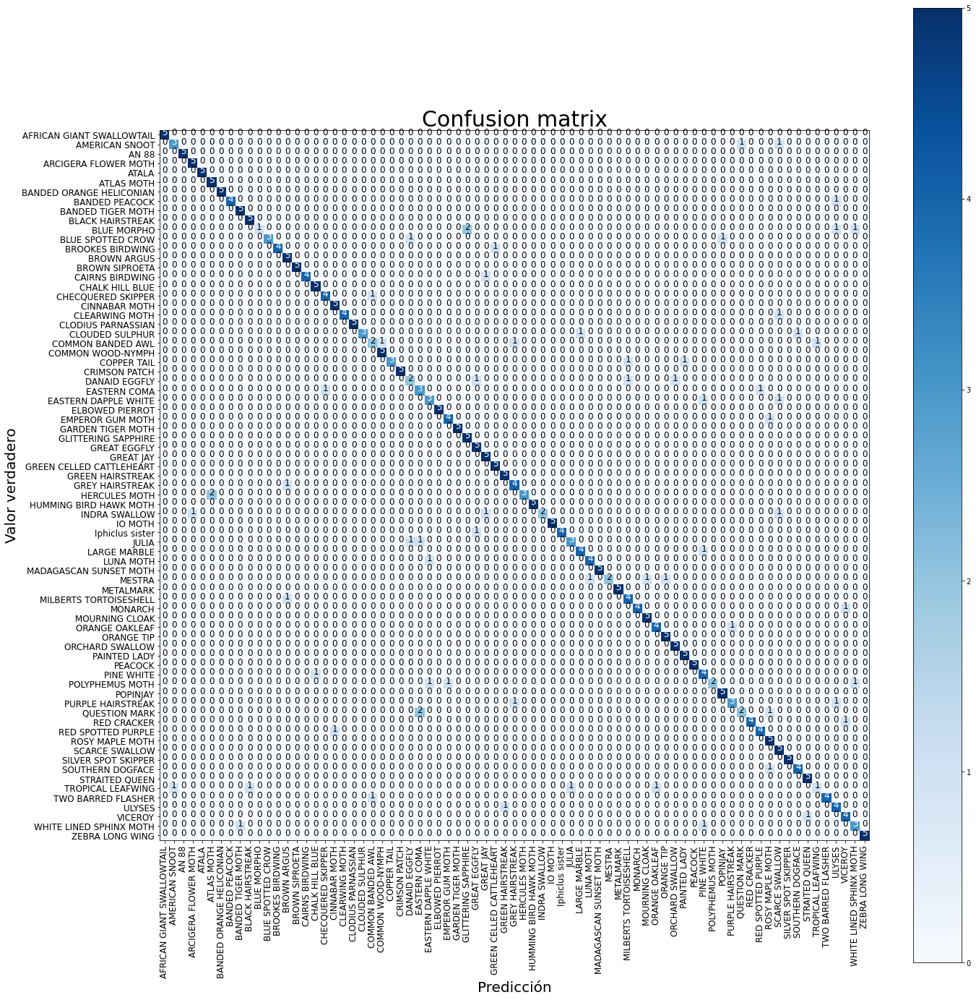

In [ ]:
matrix = confusion_matrix(label_valid_cat, decoded_predictions)
plt.figure(figsize=(20,20))
plot_confusion_matrix(matrix, claseslist)

# Conclusiones.

Se realizó la separación de las imagenes en diferentes canales, donde se observó que en las descomposiciones de algunos no se observaron grandes diferencias que permitieran segmentar las imagenes. También se concluyó que por las condiciones cromáticas del objeto de estudio, lo más apropiado para segmentar las imagenes es en el canal HSV, en especial el canal S(aquel que se encarga de medir la pureza de los colores o la ausencia de otros). Con esto fue posible obtener una imagen limpia y con la de mariposa deseada.

De la precisión podemos decir que está alrededor de un 80%. Esto significa que aproximadamente el 80% de las mariposas que clasifique el modelo son de la especie que indicó la red neuronal.
Del recall podemos concluir que en la mayoria de ocasiones el modelo predecirá bien 4 de cada 5 especies de mariposas.
Según la exactitud el modelo acierta cerca del 80% de las veces.
Consultando un poco encontramos que la métrica de exactitud no es tan buena, sin embargo podemos ver que la precisión y el recall son muy buenas y son mas precisas, además nuestras clases están bien balanceadas.

Viendo las métricas de exactitud de los algoritmos mostrados en clase y en las prácticas podemos llegar a la conclusión de que nuestra red clasifica de una muy buena manera las mariposas, esto lo explicamos nosotros gracias a el orden tan bueno del dataset, la calidad de las imágenes, además del preprocesamiento de estas y el planteamiento de la red neuronal.

Para este proyecto fue necesario realizar 2 veces un pre procesamiento de las imagenes. El primero fue muy importante para facilitarle el trabajo a nustra red convolucional, mediante la 
herramienta "resize", esto debido a la gran cantidad de elementos que contiene el dataset empleado.
El segundo pre procesamiento está ligado a la etapa de los canales de desempeño, donde se hizo una conversión de las imagenes en distintos formatos (LAB, RGB, XYZ y YCrCb); donde se realizaron distintas pruebas en los diferentes canales y se determinó mediante la práctica que los mejores resultados se dan en el formato YCrCb, especificamente en el canal Y.


